# ImageNet veri seti ile Nesne Tanıma

### Gerekli Kütüphanelerin Kurulması :

In [1]:
import os
import numpy as np
from PIL import Image
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications import imagenet_utils
from tensorflow.keras.preprocessing.image import img_to_array
from io import BytesIO
import requests

### Kerasta önceden eğitilmiş bir modeli yükleme

In [2]:
model = ResNet50(weights="imagenet")

I0000 00:00:1738405797.014167   21020 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 2915 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1070, pci bus id: 0000:01:00.0, compute capability: 6.1
I0000 00:00:1738405797.015608   21020 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 6634 MB memory:  -> device: 1, name: NVIDIA GeForce GTX 1070, pci bus id: 0000:02:00.0, compute capability: 6.1


102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 19s 0us/step


**Model yapısına bir göz atalım :** Hangi katmanlar var ve katmanların özellikleri neler?

In [82]:
#layers = dict([(layer.name, layer.output) for layer in model.layers])

### Resmi girişe uygun formata getirmek için boyutlandırma fonksiyonu

In [83]:
def prepare_image(image,target):
    #giriş görüntüsünü yeniden boyutlandırma ve ön işlemlerin yapılması
    image = image.resize(target)
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)
    image = imagenet_utils.preprocess_input(image)

    #İşlenmiş görüntüyü alma
    return image

In [84]:
# Sınıflandırılmasını istediğimiz resmin linki
#ImageURL ="https://upload.wikimedia.org/wikipedia/commons/thumb/b/be/Crocuta-hejda.jpg/220px-Crocuta-hejda.jpg"

In [114]:
ImageURL = input("Resmin kopyaladığınız internet linkini giriniz :")

Resmin kopyaladığınız internet linkini giriniz : https://ap.etsem.org/pluginfile.php/10937/course/overviewfiles/osnovy_big.jpg


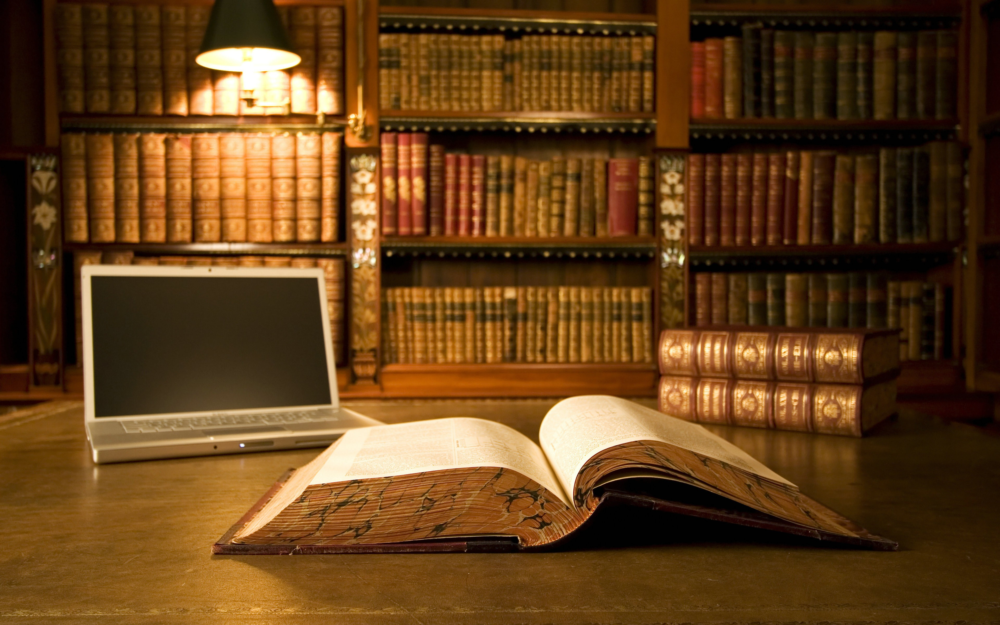

In [116]:
response = requests.get(ImageURL)
image = Image.open(BytesIO(response.content))
image

### Eğitilmiş modelden Sınıflandırma Yapılması

In [139]:
data["success"]=False
pre_image = prepare_image(image, target=((224,224)))
preds = model.predict(pre_image)

results = imagenet_utils.decode_predictions(preds)
data["Predictions"] = []

for (imagenetID, label, prob) in results[0]:
    r= {"Label":label, "probability":float(prob)}
    data["Predictions"].append(r)

data["success"]=True

print(data)

tahmin_oranı = data['Predictions'][0]['probability']
tahmin =data['Predictions'][0]['Label']
print(f"\nSınıflandırma tahmini en yüksek yüzde {tahmin_oranı * 100:.2f} oranıyla {tahmin}'dır.\n")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
{'success': True, 'Predictions': [{'Label': 'library', 'probability': 0.9849157333374023}, {'Label': 'bookcase', 'probability': 0.009943629615008831}, {'Label': 'bookshop', 'probability': 0.003190817777067423}, {'Label': 'desk', 'probability': 0.0008664922788739204}, {'Label': 'laptop', 'probability': 0.0001473377487855032}]}

Sınıflandırma tahmini en yüksek yüzde 98.49 oranıyla library'dır.



In [144]:
for i in range(4):
    print(f"Görüntü %{data['Predictions'][i]['probability'] * 100:,.3f}\t ihtimalle : {data['Predictions'][i]['Label']}")

Görüntü %98.492	 ihtimalle : library
Görüntü %0.994	 ihtimalle : bookcase
Görüntü %0.319	 ihtimalle : bookshop
Görüntü %0.087	 ihtimalle : desk
